# INFO 5613 – Class 19: Diffusion and influence

[Brian C. Keegan, Ph.D.](http://brianckeegan.com/)  
[Assistant Professor, Department of Information Science](https://www.colorado.edu/cmci/people/information-science/brian-c-keegan)  
University of Colorado Boulder  

Copyright and distributed under an [MIT License](https://opensource.org/licenses/MIT)

## Import libraries

In [227]:
# Load networkx for working with network data
import networkx as nx

# Load numpy for working with numerical data
import numpy as np

# Load pandas for working with tabular data
import pandas as pd

# Load visualization libraries
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.ticker as ticker
import seaborn as sb

# Load libraries
import scipy.stats as stats
import os, json
from datetime import datetime, date, timezone
from collections import Counter

# Define a formatting string we can use to print the number of nodes and edges
node_edge_s = "There are {0:,} nodes and {1:,} edges in the network. Density is {2:.3f}"

We're also going to use the [ndlib](https://ndlib.readthedocs.io/en/latest/), which we install via `pip`. This only needs to be run once.

In [ ]:
! pip install ndlib

In [512]:
import ndlib.models.epidemics as ep
import ndlib.models.ModelConfig as mc
import ndlib.models.opinions as op

def iters_to_node_count_df(iters):
    iters_d = {}
    for i in iters:
        iters_d[i['iteration']] = i['node_count']
    return pd.DataFrame(iters_d).T

In [559]:
np.arange(0,200,50)

array([  0,  50, 100, 150])

In [655]:
def visualize_iters(g, iters, color_map = {-1: 'tab:green', 0: 'tab:blue', 1: 'tab:orange', 2:'tab:purple'}, time_slices = [0,12,25,50,100,200]):
    f,axs = plt.subplots(2,3,figsize=(15,10))

    att_d = {0:iters[0]['status'].copy()}

    for i,_iter in enumerate(iters):
        if i > 0:
            att_d[i] = att_d[i-1].copy()
            att_d[i].update(_iter['status'])

    pos = nx.layout.kamada_kawai_layout(g)

    for i,t in enumerate(time_slices):
        _ax = axs.flatten()[i]
        nx.draw_networkx(
            g,
            pos,
            with_labels = False,
            ax=_ax,
            node_color=[color_map[att_d[t][n]] for n in g.nodes()],
            node_size=25
        )
        _ax.set_title("$T = {0}$".format(t))

    f.tight_layout()
    return f,axs

## Networks

In [540]:
er_g = nx.erdos_renyi_graph(250,.025)
ws_g = nx.watts_strogatz_graph(250,4,.05)
ba_g = nx.barabasi_albert_graph(250,1)
sb_g = nx.stochastic_block_model(sizes = [62,63,62,63],
                                 p = [[.1,.001,.001,.001],
                                      [.001,.1,.001,.001],
                                      [.001,.001,.1,.001],
                                      [.001,.001,.001,.1]]
                                )

print(node_edge_s.format(er_g.number_of_nodes(),er_g.number_of_edges(),nx.density(er_g)))
print(node_edge_s.format(ws_g.number_of_nodes(),ws_g.number_of_edges(),nx.density(ws_g)))
print(node_edge_s.format(ba_g.number_of_nodes(),ba_g.number_of_edges(),nx.density(ba_g)))
print(node_edge_s.format(sb_g.number_of_nodes(),sb_g.number_of_edges(),nx.density(sb_g)))

There are 250 nodes and 745 edges in the network. Density is 0.024
There are 250 nodes and 500 edges in the network. Density is 0.016
There are 250 nodes and 249 edges in the network. Density is 0.008
There are 250 nodes and 807 edges in the network. Density is 0.026


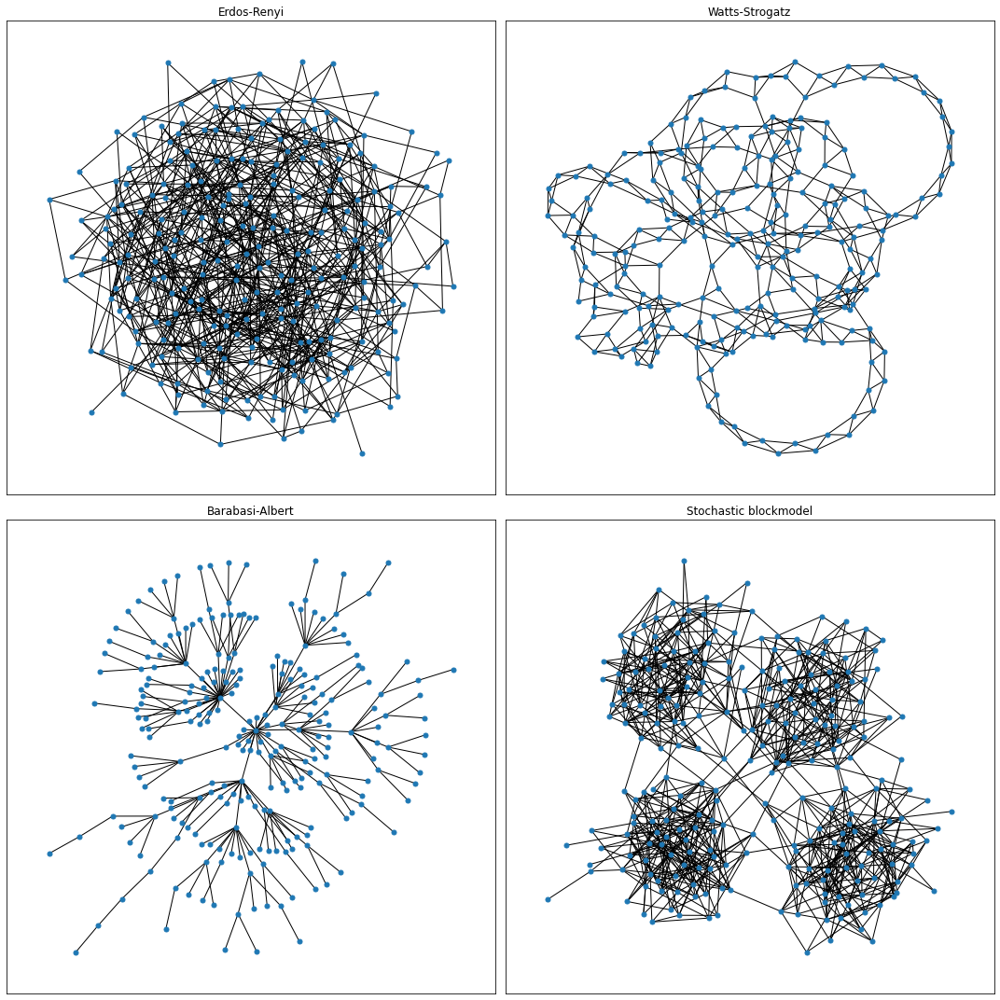

In [710]:
f,axs = plt.subplots(2,2,figsize=(15,15))

for i,g in enumerate([er_g,ws_g,ba_g,sb_g]):
    _ax = axs.flatten()[i]
    pos = nx.layout.kamada_kawai_layout(g)
    nx.draw_networkx(
        g,
        pos,
        with_labels = False,
        ax=_ax,
        node_size=25
    )
    
axs[0,0].set_title('Erdos-Renyi')
axs[0,1].set_title('Watts-Strogatz')
axs[1,0].set_title('Barabasi-Albert')
axs[1,1].set_title('Stochastic blockmodel')

f.tight_layout()
f.savefig('random_networks.png',facecolor='w',bbox_inches='tight')

## Compartmental models

![Classic compartmental models](https://www.researchgate.net/profile/Konstantinos-Theodorakos/publication/324330640/figure/fig2/AS:613429198995458@1523264326770/Some-typical-Compartmental-Models-commonly-used-in-epidemiology-1.png)

## SI model

### Erdos-Renyi network

In [541]:
# Model selection
er_si_model = ep.SIModel(er_g)

# Model configuration
er_si_config = mc.Configuration()
er_si_config.add_model_parameter('beta',0.01)
er_si_config.add_model_parameter('fraction_infected',0.05)
er_si_model.set_initial_status(er_si_config)

# Run simulation
er_si_iters = er_si_model.iteration_bunch(500)

Visualize spread on network.

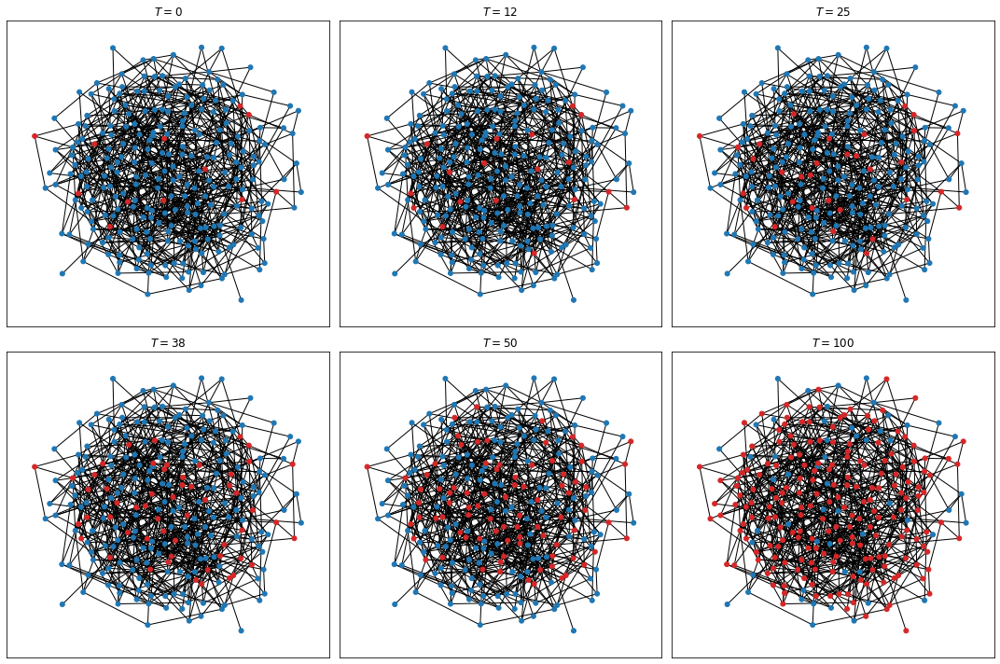

In [563]:
f,axs = visualize_iters(er_g,er_si_iters,time_slices=[0,12,25,38,50,100])

Visualize the prevalence of uninfected and infected over time.

Text(0.5, 1.0, 'Erdos-Renyi graph, $N=250$, $\\beta=0.01$, $f_0=0.05$')

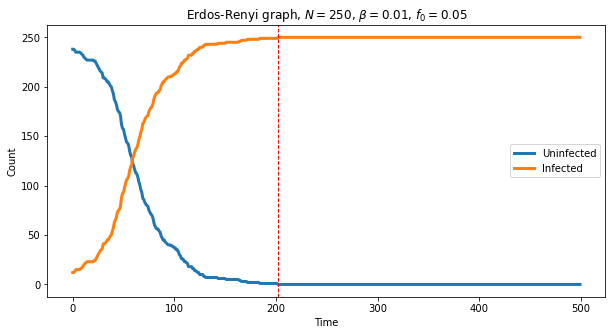

In [237]:
_df = iters_to_node_count_df(er_si_iters)
_df.columns = ['Uninfected','Infected']

f,ax = plt.subplots(figsize=(10,5))

_df.plot(ax=ax,lw=3)

#All infected when?
t_all = _df.loc[_df['Infected'] == 250,'Infected'].idxmin()

ax.axvline(t_all,ls='--',lw=1,c='r')
ax.set_ylabel('Count')
ax.set_xlabel('Time')
ax.set_title(r'Erdos-Renyi graph, $N=250$, $\beta=0.01$, $f_0=0.05$')

### Watts-Strogatz network

In [544]:
# Model selection
ws_si_model = ep.SIModel(ws_g)

# Model configuration
ws_si_config = mc.Configuration()
ws_si_config.add_model_parameter('beta',0.01)
ws_si_config.add_model_parameter('fraction_infected',0.05)
ws_si_model.set_initial_status(ws_si_config)

# Run simulation
ws_si_iters = ws_si_model.iteration_bunch(750)

Visualize the spread on a network.

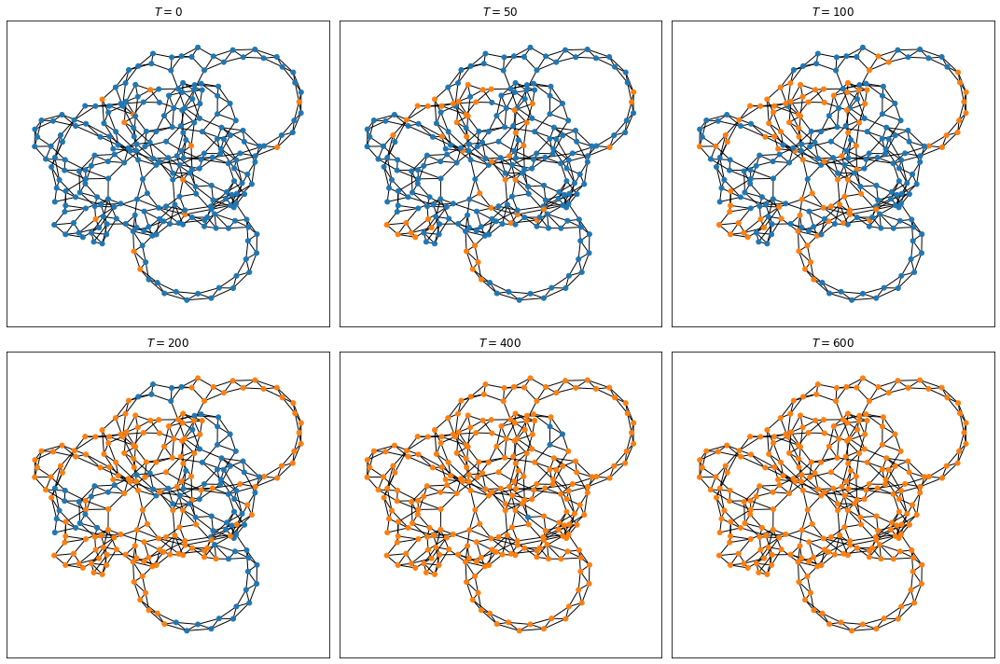

In [711]:
f,axs = visualize_iters(ws_g,ws_si_iters,time_slices=[0,50,100,200,400,600])

f.tight_layout()
f.savefig('si_watts_strogatz.png',facecolor='w',bbox_inches='tight')

Visualize the prevalence of the two states.

Text(0.5, 1.0, 'Watts-Strogatz graph, $N=250$, $\\beta=0.01$, $f_0=0.05$')

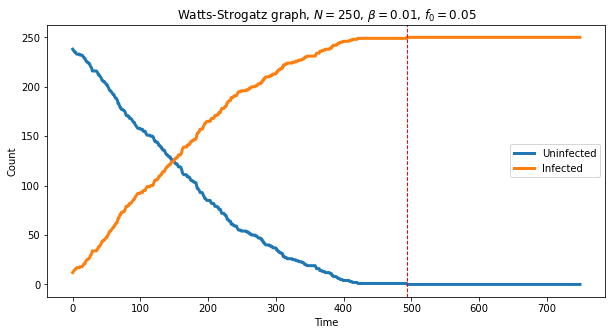

In [546]:
_df = iters_to_node_count_df(ws_si_iters)
_df.columns = ['Uninfected','Infected']

f,ax = plt.subplots(figsize=(10,5))

_df.plot(ax=ax,lw=3)

#All infected when?
t_all = _df.loc[_df['Infected'] == 250,'Infected'].idxmin()

ax.axvline(t_all,ls='--',lw=1,c='r')
ax.set_ylabel('Count')
ax.set_xlabel('Time')
ax.set_title(r'Watts-Strogatz graph, $N=250$, $\beta=0.01$, $f_0=0.05$')

### Barabasi-Albert network

In [565]:
# Model selection
ba_si_model = ep.SIModel(ba_g)

# Model configuration
ba_si_config = mc.Configuration()
ba_si_config.add_model_parameter('beta',0.01)
ba_si_config.add_model_parameter('fraction_infected',0.05)
ba_si_model.set_initial_status(ba_si_config)

# Run simulation
ba_si_iters = ba_si_model.iteration_bunch(750)

Visualize the spread on the network.

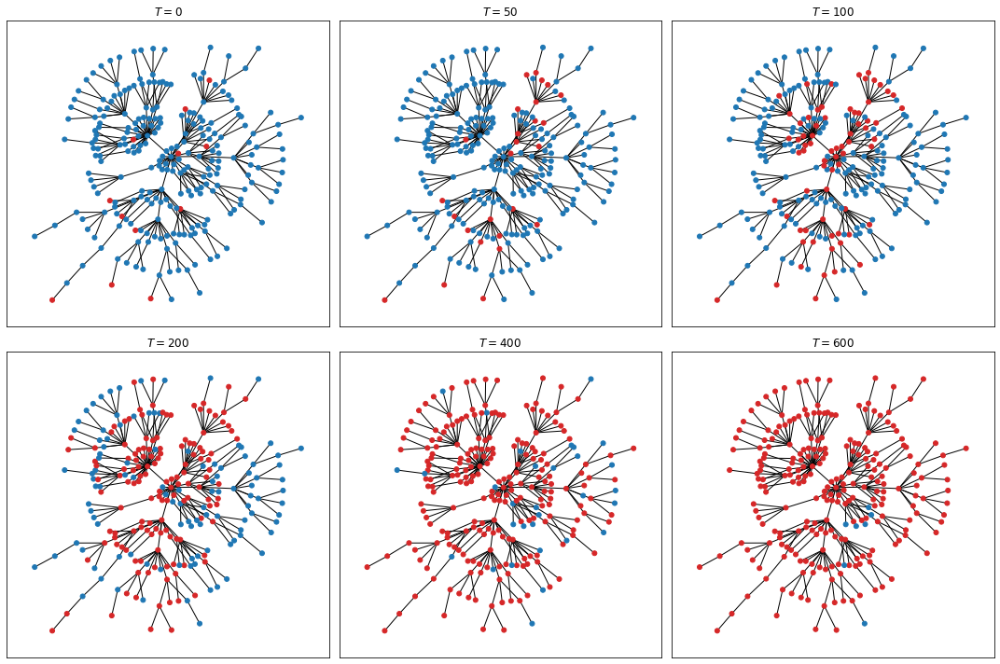

In [566]:
f,axs = visualize_iters(ba_g,ba_si_iters,time_slices=[0,50,100,200,400,600])

Visualize the prevalence of the two states.

Text(0.5, 1.0, 'Barabasi-Albert graph, $N=250$, $\\beta=0.01$, $f_0=0.05$')

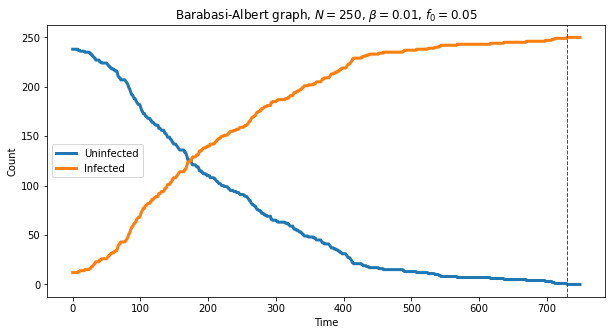

In [567]:
_df = iters_to_node_count_df(ba_si_iters)
_df.columns = ['Uninfected','Infected']

f,ax = plt.subplots(figsize=(10,5))

_df.plot(ax=ax,lw=3)

#All infected when?
t_all = _df.loc[_df['Infected'] == 250,'Infected'].idxmin()

ax.axvline(t_all,ls='--',lw=1,c='r')
ax.set_ylabel('Count')
ax.set_xlabel('Time')
ax.set_title(r'Barabasi-Albert graph, $N=250$, $\beta=0.01$, $f_0=0.05$')

### Stochastic blockmodel network

In [283]:
# Model selection
sb_si_model = ep.SIModel(sb_g)

# Model configuration
sb_si_config = mc.Configuration()
sb_si_config.add_model_parameter('beta',0.01)
sb_si_config.add_model_parameter('fraction_infected',0.05)
sb_si_model.set_initial_status(sb_si_config)

# Run simulation
sb_si_iters = sb_si_model.iteration_bunch(750)

Visualize the spread on the network.

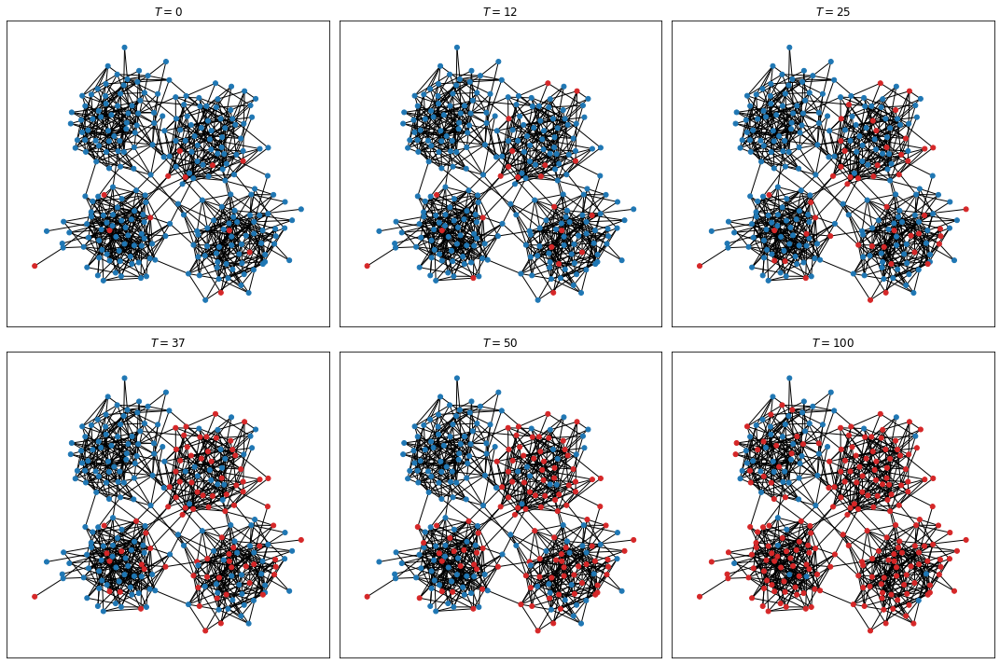

In [568]:
f,axs = visualize_iters(sb_g,sb_si_iters,time_slices=[0,12,25,37,50,100])

Visualize the prevalence of the two states.

Text(0.5, 1.0, 'Stochastic blockmodel graph, $N=250$, $\\beta=0.01$, $f_0=0.05$')

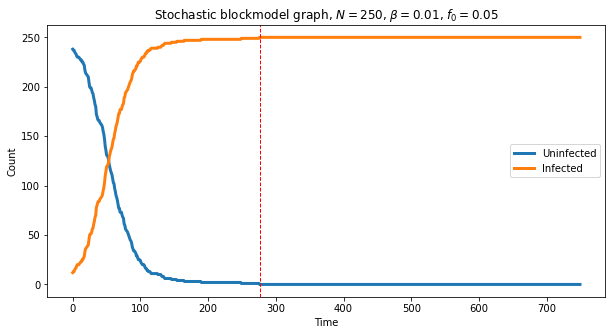

In [246]:
_df = iters_to_node_count_df(sb_si_iters)
_df.columns = ['Uninfected','Infected']

f,ax = plt.subplots(figsize=(10,5))

_df.plot(ax=ax,lw=3)

#All infected when?
t_all = _df.loc[_df['Infected'] == 250,'Infected'].idxmin()

ax.axvline(t_all,ls='--',lw=1,c='r')
ax.set_ylabel('Count')
ax.set_xlabel('Time')
ax.set_title(r'Stochastic blockmodel graph, $N=250$, $\beta=0.01$, $f_0=0.05$')

### Compare the spread on the four different network types

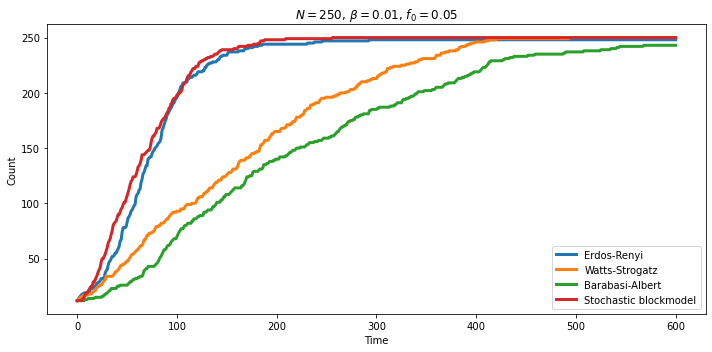

In [712]:
infected_c = pd.concat([
    iters_to_node_count_df(er_si_iters),
    iters_to_node_count_df(ws_si_iters),
    iters_to_node_count_df(ba_si_iters),
    iters_to_node_count_df(sb_si_iters),
],
    axis=1
)

infected_c = infected_c[1]
infected_c.columns = ['Erdos-Renyi','Watts-Strogatz','Barabasi-Albert','Stochastic blockmodel']
infected_c.fillna(method='ffill',inplace=True)

f,ax = plt.subplots(figsize=(10,5))
infected_c.loc[:600].plot(ax=ax,lw=3)
ax.set_ylabel('Count')
ax.set_xlabel('Time')
ax.set_title(r'$N=250$, $\beta=0.01$, $f_0=0.05$')

f.tight_layout()
f.savefig('si_infection_growth.png',facecolor='w',bbox_inches='tight')

### Simulate multiple runs to identify average pattern

In [261]:
er_si_multiiter = {}
ws_si_multiiter = {}
ba_si_multiiter = {}
sb_si_multiiter = {}

for i in range(100):
    er_si_model.reset()
    er_iters = er_si_model.iteration_bunch(300)
    er_si_multiiter[i] = iters_to_node_count_df(er_iters)
    
    ws_si_model.reset()
    ws_iters = ws_si_model.iteration_bunch(600)
    ws_si_multiiter[i] = iters_to_node_count_df(ws_iters)
    
    ba_si_model.reset()
    ba_iters = ba_si_model.iteration_bunch(600)
    ba_si_multiiter[i] = iters_to_node_count_df(ba_iters)
    
    sb_si_model.reset()
    sb_iters = sb_si_model.iteration_bunch(300)
    sb_si_multiiter[i] = iters_to_node_count_df(sb_iters)

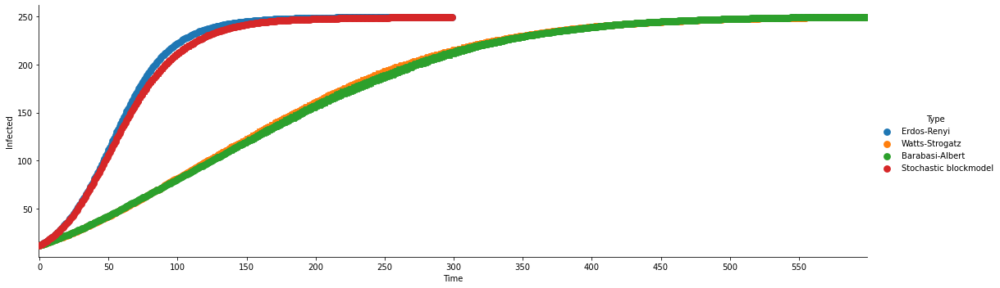

In [262]:
er_multiiter_df = pd.concat(er_si_multiiter).reset_index()
ws_multiiter_df = pd.concat(ws_si_multiiter).reset_index()
ba_multiiter_df = pd.concat(ba_si_multiiter).reset_index()
sb_multiiter_df = pd.concat(sb_si_multiiter).reset_index()

si_multiiter_df = pd.concat({
    'Erdos-Renyi':er_multiiter_df,
    'Watts-Strogatz':ws_multiiter_df,
    'Barabasi-Albert':ba_multiiter_df,
    'Stochastic blockmodel':sb_multiiter_df
})
si_multiiter_df.columns = ['Model','Time','Uninfected','Infected']
si_multiiter_df = si_multiiter_df.reset_index(0)
si_multiiter_df.rename(columns={'level_0':'Type'},inplace=True)
si_multiiter_df.head()

g = sb.catplot(
    data=si_multiiter_df,
    x='Time',
    y='Infected',
    kind='point',
    hue='Type',
    aspect=3,
    hue_order=['Erdos-Renyi',
               'Watts-Strogatz',
               'Barabasi-Albert',
               'Stochastic blockmodel'
              ]
)

# https://stackoverflow.com/a/44525175/1574687
g.ax.xaxis.set_major_locator(ticker.MultipleLocator(50))
g.ax.xaxis.set_major_formatter(ticker.ScalarFormatter())

<AxesSubplot:xlabel='Time', ylabel='Count'>

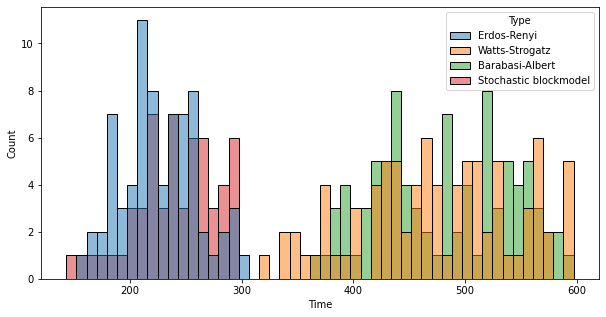

In [263]:
time_to_max = si_multiiter_df[si_multiiter_df['Infected'] == 250].groupby(['Type','Model']).agg({'Time':'min'}).reset_index()

f,ax = plt.subplots(figsize=(10,5))
sb.histplot(
    data=time_to_max,
    x='Time',
    hue='Type',
    bins=50,
    hue_order=['Erdos-Renyi',
               'Watts-Strogatz',
               'Barabasi-Albert',
               'Stochastic blockmodel'
              ],
    ax = ax
)

### Strategically seed infections

#### Seed one block of a stochastic blockmodel
Use the stochastic block model and infect 12 of the nodes in just one block.

In [549]:
# Model selection
seeded_sb_si_model = ep.SIModel(sb_g)

# Model configuration
seeded_sb_si_config = mc.Configuration()
seeded_sb_si_config.add_model_parameter('beta',0.01)

# Identify 12 nodes in block 0
block0 = [n for i,(n,d) in enumerate(dict(sb_g.nodes(data=True)).items()) if d['block'] == 0 and i < 12]

# Add these nodes to the model configuration
seeded_sb_si_config.add_model_initial_configuration(status_name = "Infected", nodes = block0)

# Configure the model
seeded_sb_si_model.set_initial_status(seeded_sb_si_config)

# Run simulation
seeded_sb_si_iters = seeded_sb_si_model.iteration_bunch(300)

Visualize iterations.

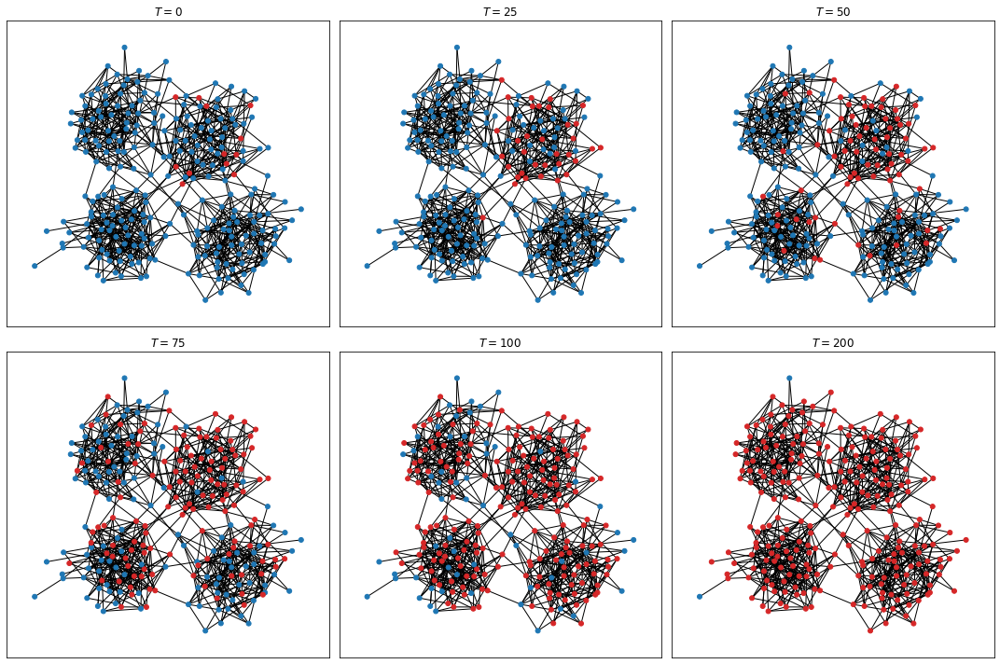

In [569]:
f,axs = visualize_iters(sb_g,seeded_sb_si_iters,time_slices=[0,25,50,75,100,200])

The community structure confers some "resilience" in the form of slightly delaying the spread of the disease to the rest of the network compared to the seeded nodes being spread throughout.

Text(0.5, 1.0, 'Stochastic blockmodels, $N=250$, $\\beta=0.01$, $f_0=0.05$')

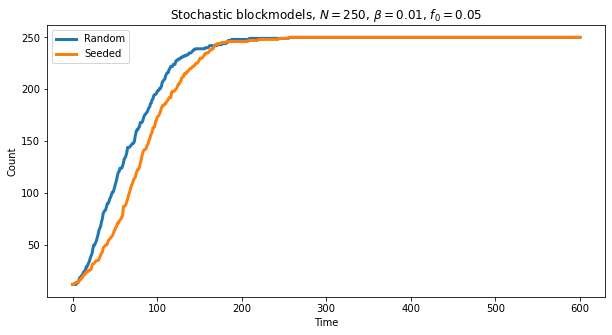

In [289]:
infected_c = pd.concat([
    iters_to_node_count_df(sb_si_iters),
    iters_to_node_count_df(seeded_sb_si_iters),
],
    axis=1
)

infected_c = infected_c[1]
infected_c.columns = ['Random','Seeded']
infected_c.fillna(method='ffill',inplace=True)

f,ax = plt.subplots(figsize=(10,5))
infected_c.loc[:600].plot(ax=ax,lw=3)
ax.set_ylabel('Count')
ax.set_xlabel('Time')
ax.set_title(r'Stochastic blockmodels, $N=250$, $\beta=0.01$, $f_0=0.05$')

#### Seed the top degree centrality nodes

In [297]:
# Model selection
top12_dc_sb_si_model = ep.SIModel(sb_g)

# Model configuration
top12_dc_sb_si_config = mc.Configuration()
top12_dc_sb_si_config.add_model_parameter('beta',0.01)

# Identify the 12 nodes with the highest degree centrality
sb_dc_top12 = [n for (n,dc) in sorted(sb_g.degree(),key=lambda x:x[1], reverse=True)[:12]]

# Add these nodes to the model configuration
top12_dc_sb_si_config.add_model_initial_configuration(status_name = "Infected", nodes = sb_dc_top12)

# Configure the model
top12_dc_sb_si_model.set_initial_status(top12_dc_sb_si_config)

# Run simulation
top12_dc_sb_si_iters = top12_dc_sb_si_model.iteration_bunch(300)

Visualize iterations.

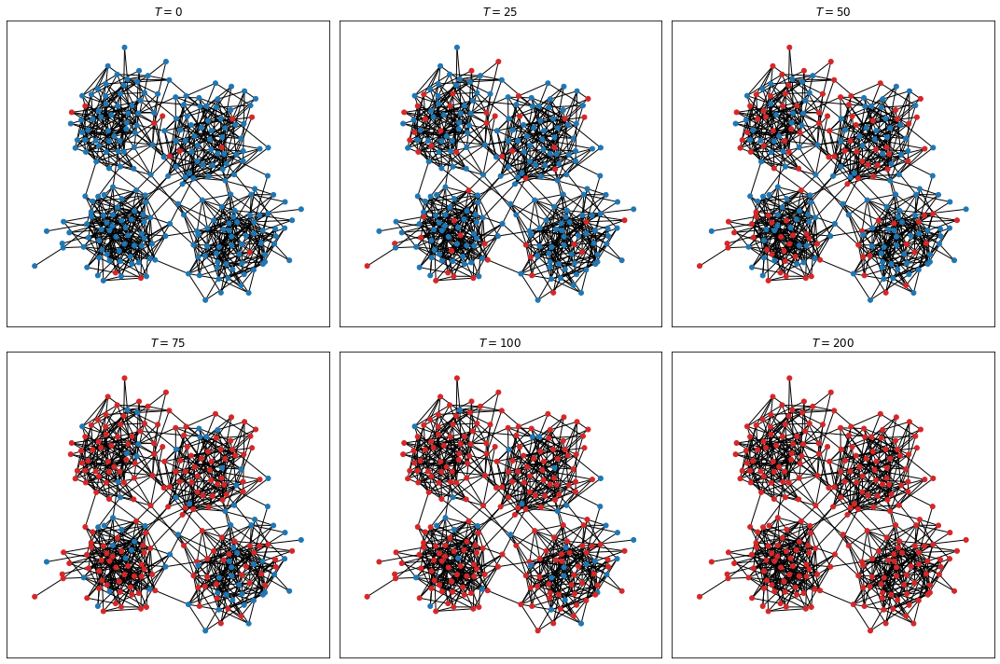

In [570]:
f,axs = visualize_iters(sb_g,top12_dc_sb_si_iters,time_slices=[0,25,50,75,100,200])

Seeding on degree (maybe) increases the diffusion speed.

Text(0.5, 1.0, 'Stochastic blockmodels, $N=250$, $\\beta=0.01$, $f_0=0.05$')

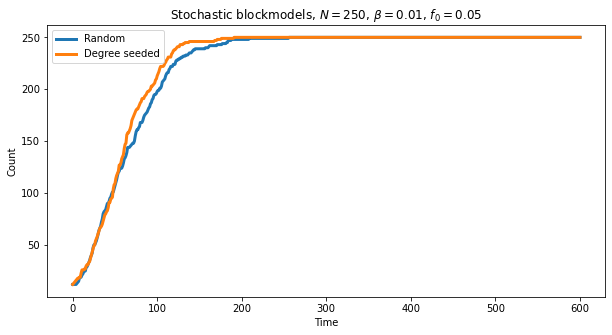

In [312]:
infected_c = pd.concat([
    iters_to_node_count_df(sb_si_iters),
    iters_to_node_count_df(seeded_sb_si_iters),
    iters_to_node_count_df(top12_dc_sb_si_iters),
],
    axis=1
)

infected_c = infected_c[1]
infected_c.columns = ['Random','Single block','Degree seeded','Closeness seeded']
infected_c.fillna(method='ffill',inplace=True)

f,ax = plt.subplots(figsize=(10,5))
infected_c.loc[:600].plot(ax=ax,lw=3)
ax.set_ylabel('Count')
ax.set_xlabel('Time')
ax.set_title(r'Stochastic blockmodels, $N=250$, $\beta=0.01$, $f_0=0.05$')

### Seed the top closeness centrality nodes

In [572]:
# Model selection
top12_cc_sb_si_model = ep.SIModel(sb_g)

# Model configuration
top12_cc_sb_si_config = mc.Configuration()
top12_cc_sb_si_config.add_model_parameter('beta',0.01)

# Identify the 12 nodes with the highest closeness centrality
sb_cc_top12 = [n for (n,dc) in sorted(nx.closeness_centrality(sb_g).items(),key=lambda x:x[1], reverse=True)[:12]]

# Add these nodes to the model configuration
top12_cc_sb_si_config.add_model_initial_configuration(status_name = "Infected", nodes = sb_cc_top12)

# Configure the model
top12_cc_sb_si_model.set_initial_status(top12_cc_sb_si_config)

# Run simulation
top12_cc_sb_si_iters = top12_cc_sb_si_model.iteration_bunch(300)

Visualize iterations.

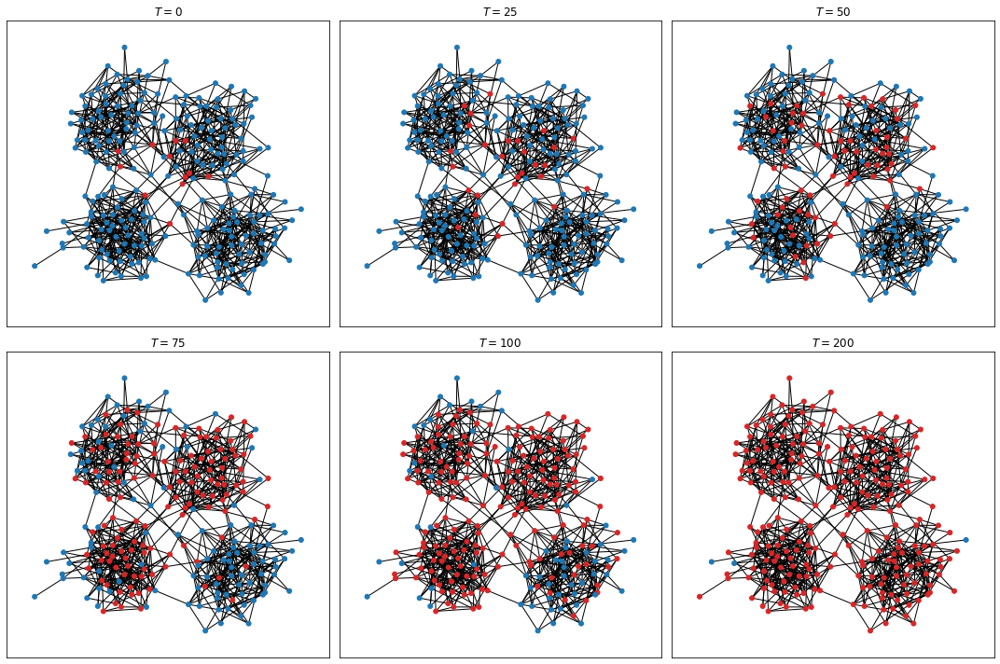

In [573]:
f,axs = visualize_iters(sb_g,top12_cc_sb_si_iters,time_slices=[0,25,50,75,100,200])

Seeding on closeness doesn't appear to change the diffusion speed.

Text(0.5, 1.0, 'Stochastic blockmodel+, $N=250$, $\\beta=0.01$, $f_0=0.05$')

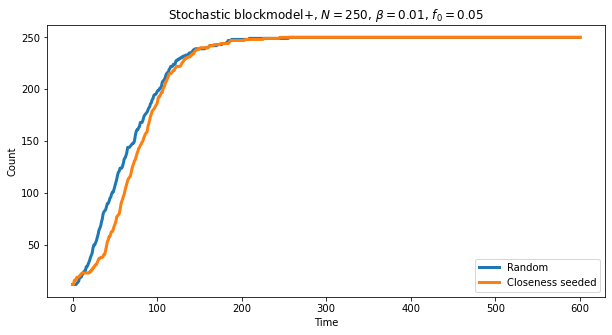

In [574]:
infected_c = pd.concat([
    iters_to_node_count_df(sb_si_iters),
    iters_to_node_count_df(seeded_sb_si_iters),
    iters_to_node_count_df(top12_dc_sb_si_iters),
    iters_to_node_count_df(top12_cc_sb_si_iters),
],
    axis=1
)

infected_c = infected_c[1]
infected_c.columns = ['Random','Single block','Degree seeded','Closeness seeded']
infected_c.fillna(method='ffill',inplace=True)

f,ax = plt.subplots(figsize=(10,5))
infected_c.loc[:600].plot(ax=ax,lw=3)
ax.set_ylabel('Count')
ax.set_xlabel('Time')
ax.set_title(r'Stochastic blockmodel+, $N=250$, $\beta=0.01$, $f_0=0.05$')

### Explore the state space

How long does it take for the agent to spread through the whole network for different values of $\beta$ and network density?

In [575]:
state_space_d = {}

for beta in np.linspace(0.001,1,25):
    state_space_d[beta] = {}
    for density in np.linspace(0.001,1,25):
        
        _g = nx.erdos_renyi_graph(250,density)
        
        # Model selection
        ss_er_si_model = ep.SIModel(_g)

        # Model configuration
        ss_er_si_config = mc.Configuration()
        ss_er_si_config.add_model_parameter('beta',beta)
        ss_er_si_config.add_model_parameter('fraction_infected',0.05)
        ss_er_si_model.set_initial_status(ss_er_si_config)

        # Run simulation
        ss_er_si_iters = ss_er_si_model.iteration_bunch(1000)
        
        # Count time when fully-diffused
        node_counts = iters_to_node_count_df(ss_er_si_iters)
        
        try:
            # Get the first time the infected count was 250
            state_space_d[beta][density] = node_counts.loc[node_counts[1] == 250,1].idxmin()
        except ValueError:
            # If it's not present, it didn't happen in the first 1000 iterations, set to 1000
            state_space_d[beta][density] = 1e3
        except KeyboardInterrupt:
            break

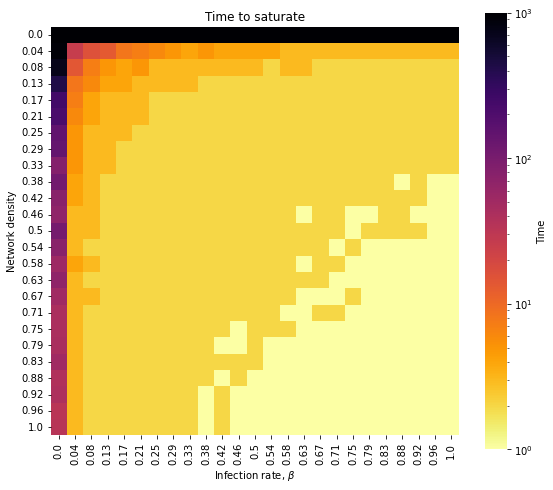

In [576]:
_df = pd.DataFrame(state_space_d)
_df.index = [round(i,2) for i in _df.index]
_df.columns = [round(i,2) for i in _df.columns]

f,ax = plt.subplots(figsize=(8,8))
sb.heatmap(
    data = _df,
    square = True,
    norm = mcolors.LogNorm(
        vmin = 1e0,
        vmax = 1e3),
#         linthresh = 1e0),
    ax = ax,
    cmap = 'inferno_r',
    cbar_kws = {'label':'Time','shrink':.8}
)
ax.set_xlabel(r'Infection rate, $\beta$')
ax.set_ylabel(r'Network density')
ax.set_title('Time to saturate')
f.tight_layout()

## SIS model

In [552]:
# Model selection
er_sis_model = ep.SISModel(er_g)

# Model configuration
er_sis_config = mc.Configuration()
er_sis_config.add_model_parameter('beta',0.01)
er_sis_config.add_model_parameter('lambda',0.02)
er_sis_config.add_model_parameter('fraction_infected',0.05)
er_sis_model.set_initial_status(er_sis_config)

# Run simulation
er_sis_iters = er_sis_model.iteration_bunch(500)

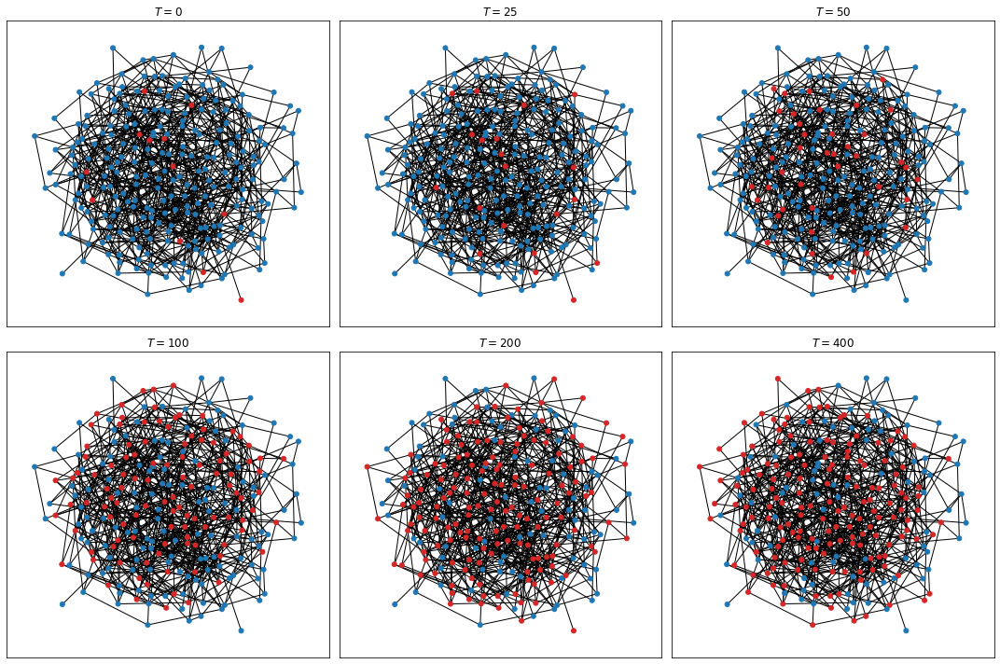

In [577]:
f,axs = visualize_iters(er_g,er_sis_iters,time_slices=[0,25,50,100,200,400])

Text(0.5, 1.0, 'Erdos-Renyi graph, $N=250$, $\\beta=0.01$, $\\gamma=0.02$, $f_0=0.05$')

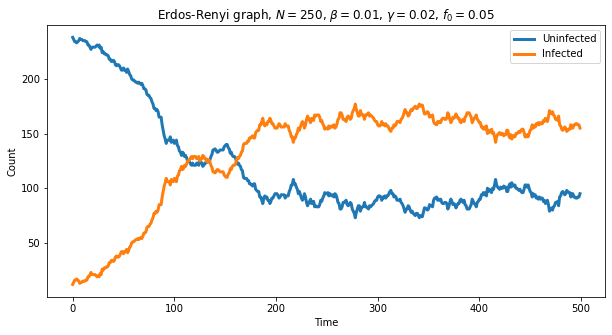

In [554]:
_df = iters_to_node_count_df(er_sis_iters)
_df.columns = ['Uninfected','Infected']

f,ax = plt.subplots(figsize=(10,5))

_df.plot(ax=ax,lw=3)

ax.set_ylabel('Count')
ax.set_xlabel('Time')
ax.set_title(r'Erdos-Renyi graph, $N=250$, $\beta=0.01$, $\gamma=0.02$, $f_0=0.05$')

Text(0.5, 1.0, 'Watts-Strogatz graph, $N=250$, $\\beta=0.01$, $\\gamma=0.02$, $f_0=0.05$')

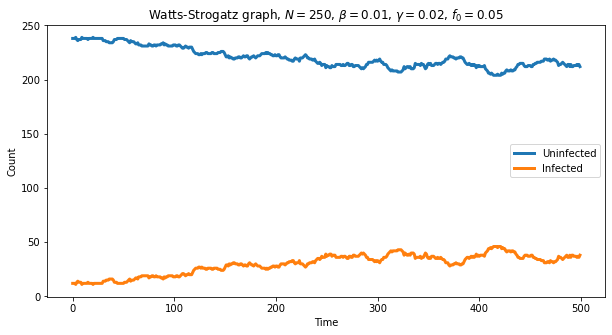

In [555]:
# Model selection
ws_sis_model = ep.SISModel(ws_g)

# Model configuration
ws_sis_config = mc.Configuration()
ws_sis_config.add_model_parameter('beta',0.01)
ws_sis_config.add_model_parameter('lambda',0.02)
ws_sis_config.add_model_parameter('fraction_infected',0.05)
ws_sis_model.set_initial_status(ws_sis_config)

# Run simulation
ws_sis_iters = ws_sis_model.iteration_bunch(500)

# Convert to DataFrame
_df = iters_to_node_count_df(ws_sis_iters)
_df.columns = ['Uninfected','Infected']

# Visualize
f,ax = plt.subplots(figsize=(10,5))

_df.plot(ax=ax,lw=3)

ax.set_ylabel('Count')
ax.set_xlabel('Time')
ax.set_title(r'Watts-Strogatz graph, $N=250$, $\beta=0.01$, $\gamma=0.02$, $f_0=0.05$')

Text(0.5, 1.0, 'Barabasi-Albert graph, $N=250$, $\\beta=0.01$, $\\gamma=0.02$, $f_0=0.05$')

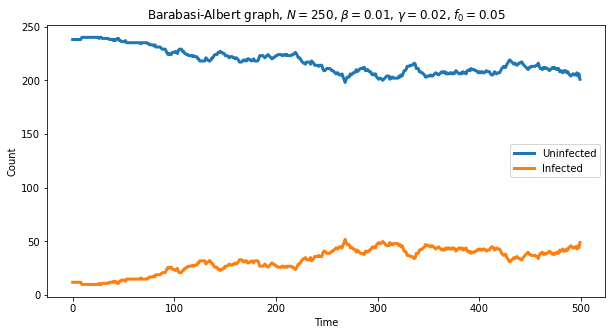

In [556]:
# Model selection
ba_sis_model = ep.SISModel(ba_g)

# Model configuration
ba_sis_config = mc.Configuration()
ba_sis_config.add_model_parameter('beta',0.01)
ba_sis_config.add_model_parameter('lambda',0.02)
ba_sis_config.add_model_parameter('fraction_infected',0.05)
ba_sis_model.set_initial_status(ba_sis_config)

# Run simulation
ba_sis_iters = ba_sis_model.iteration_bunch(500)

# Convert to DataFrame
_df = iters_to_node_count_df(ba_sis_iters)
_df.columns = ['Uninfected','Infected']

# Visualize
f,ax = plt.subplots(figsize=(10,5))

_df.plot(ax=ax,lw=3)

ax.set_ylabel('Count')
ax.set_xlabel('Time')
ax.set_title(r'Barabasi-Albert graph, $N=250$, $\beta=0.01$, $\gamma=0.02$, $f_0=0.05$')

Text(0.5, 1.0, 'Stochastic blockmodel graph, $N=250$, $\\beta=0.01$, $\\gamma=0.02$, $f_0=0.05$')

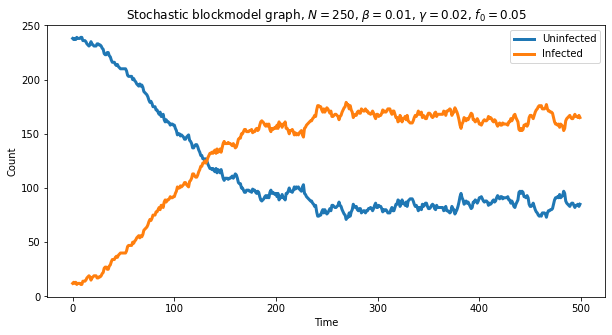

In [557]:
# Model selection
sb_sis_model = ep.SISModel(sb_g)

# Model configuration
sb_sis_config = mc.Configuration()
sb_sis_config.add_model_parameter('beta',0.01)
sb_sis_config.add_model_parameter('lambda',0.02)
sb_sis_config.add_model_parameter('fraction_infected',0.05)
sb_sis_model.set_initial_status(sb_sis_config)

# Run simulation
sb_sis_iters = sb_sis_model.iteration_bunch(500)

# Convert to DataFrame
_df = iters_to_node_count_df(sb_sis_iters)
_df.columns = ['Uninfected','Infected']

# Visualize
f,ax = plt.subplots(figsize=(10,5))

_df.plot(ax=ax,lw=3)

ax.set_ylabel('Count')
ax.set_xlabel('Time')
ax.set_title(r'Stochastic blockmodel graph, $N=250$, $\beta=0.01$, $\gamma=0.02$, $f_0=0.05$')

### State space exploration

#### Erdos-Renyi graph

In [448]:
ss_sis_er_d = {}

for beta in np.linspace(0.01,1,25):
    ss_sis_er_d[beta] = {}
    for l in np.linspace(0.01,1,25):
        
        # Model selection
        ss_er_sis_model = ep.SISModel(er_g)

        # Model configuration
        ss_er_sis_config = mc.Configuration()
        ss_er_sis_config.add_model_parameter('beta',beta)
        ss_er_sis_config.add_model_parameter('lambda',l)
        ss_er_sis_config.add_model_parameter('fraction_infected',0.05)
        ss_er_sis_model.set_initial_status(ss_er_sis_config)

        # Run simulation
        ss_er_sis_iters = ss_er_sis_model.iteration_bunch(250)
        
        # Count time when fully-diffused
        node_counts = iters_to_node_count_df(ss_er_sis_iters)
        
        try:
            ss_sis_er_d[beta][l] = node_counts.loc[node_counts[1] > node_counts[0],1].idxmin()
        except ValueError:
            ss_sis_er_d[beta][l] = np.nan
        except KeyboardInterrupt:
            break

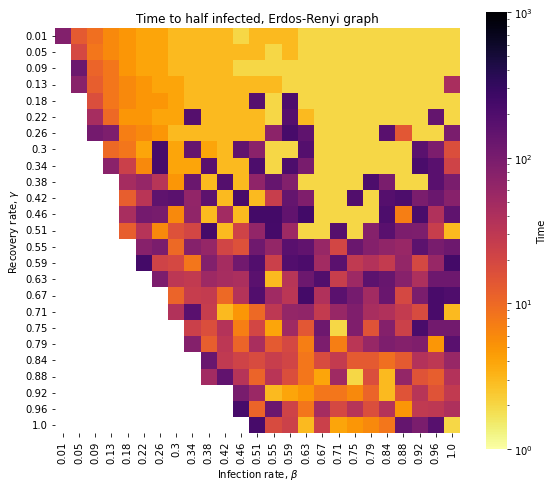

In [713]:
_df = pd.DataFrame(ss_sis_er_d)
_df.index = [round(i,2) for i in _df.index]
_df.columns = [round(i,2) for i in _df.columns]

f,ax = plt.subplots(figsize=(8,8))
sb.heatmap(
    data = _df,
    square = True,
    norm = mcolors.LogNorm(
        vmin = 1e0,
        vmax = 1e3),
#         linthresh = 1e0),
    ax = ax,
    cmap = 'inferno_r',
    cbar_kws = {'label':'Time','shrink':.8}
)
ax.set_xlabel(r'Infection rate, $\beta$')
ax.set_ylabel(r'Recovery rate, $\gamma$')
ax.set_title('Time to half infected, Erdos-Renyi graph')
f.tight_layout()
f.savefig('state_space_er_sis.png',facecolor='w',bbox_inches='tight')

#### Barabasi-Albert graph

In [445]:
ss_sis_ba_d = {}

for beta in np.linspace(0.01,1,25):
    ss_sis_ba_d[beta] = {}
    for l in np.linspace(0.01,1,25):
        
        # Model selection
        ss_ba_sis_model = ep.SISModel(ba_g)

        # Model configuration
        ss_ba_sis_config = mc.Configuration()
        ss_ba_sis_config.add_model_parameter('beta',beta)
        ss_ba_sis_config.add_model_parameter('lambda',l)
        ss_ba_sis_config.add_model_parameter('fraction_infected',0.05)
        ss_ba_sis_model.set_initial_status(ss_ba_sis_config)

        # Run simulation
        ss_ba_sis_iters = ss_ba_sis_model.iteration_bunch(250)
        
        # Count time when fully-diffused
        node_counts = iters_to_node_count_df(ss_ba_sis_iters)
        
        try:
            ss_sis_ba_d[beta][l] = node_counts.loc[node_counts[1] > node_counts[0],1].idxmin()
        except ValueError:
            ss_sis_ba_d[beta][l] = np.nan
        except KeyboardInterrupt:
            break

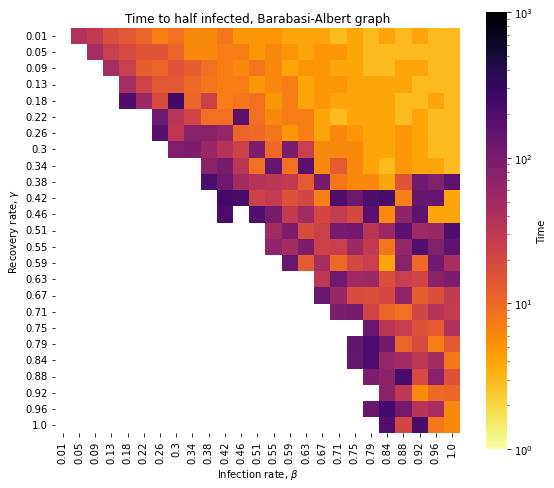

In [714]:
_df = pd.DataFrame(ss_sis_ba_d)
_df.index = [round(i,2) for i in _df.index]
_df.columns = [round(i,2) for i in _df.columns]

f,ax = plt.subplots(figsize=(8,8))
sb.heatmap(
    data = _df,
    square = True,
    norm = mcolors.LogNorm(
        vmin = 1e0,
        vmax = 1e3),
#         linthresh = 1e0),
    ax = ax,
    cmap = 'inferno_r',
    cbar_kws = {'label':'Time','shrink':.8}
)
ax.set_xlabel(r'Infection rate, $\beta$')
ax.set_ylabel(r'Recovery rate, $\gamma$')
ax.set_title('Time to half infected, Barabasi-Albert graph')
f.tight_layout()
f.savefig('state_space_ba_sis.png',facecolor='w',bbox_inches='tight')

## SIR model

### Erdos-Renyi

In [579]:
# Model selection
er_sir_model = ep.SIRModel(er_g)

# Model configuration
er_sir_config = mc.Configuration()
er_sir_config.add_model_parameter('beta',0.01)
er_sir_config.add_model_parameter('gamma',0.005)
er_sir_config.add_model_parameter('fraction_infected',0.05)
er_sir_model.set_initial_status(er_sir_config)

# Run simulation
er_sir_iters = er_sir_model.iteration_bunch(1000)

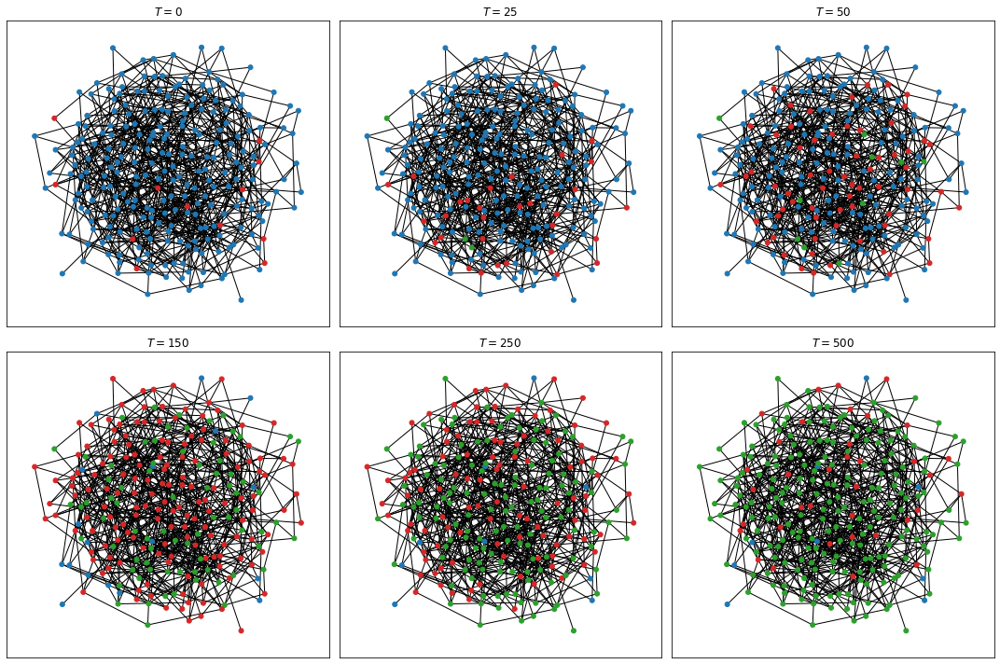

In [581]:
f,axs = visualize_iters(er_g,er_sir_iters,time_slices=[0,25,50,150,250,500])

Text(0.5, 1.0, 'Erdos-Renyi graph, $N=250$, $\\beta=0.01$, $\\gamma=0.005$, $f_0=0.05$')

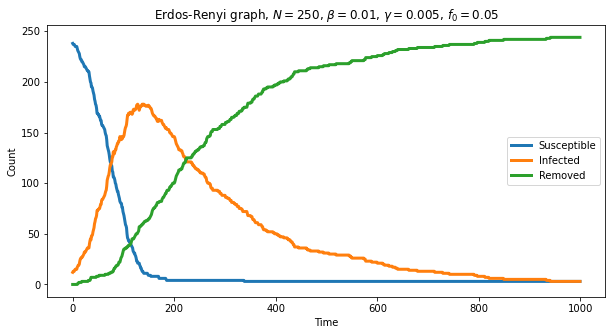

In [460]:
_df = iters_to_node_count_df(er_sir_iters)
_df.columns = ['Susceptible','Infected','Removed']

f,ax = plt.subplots(figsize=(10,5))

_df.plot(ax=ax,lw=3)

ax.set_ylabel('Count')
ax.set_xlabel('Time')
ax.set_title(r'Erdos-Renyi graph, $N=250$, $\beta=0.01$, $\gamma=0.005$, $f_0=0.05$')

### Barabasi-Albert

In [582]:
# Model selection
ba_sir_model = ep.SIRModel(ba_g)

# Model configuration
ba_sir_config = mc.Configuration()
ba_sir_config.add_model_parameter('beta',0.01)
ba_sir_config.add_model_parameter('gamma',0.005)
ba_sir_config.add_model_parameter('fraction_infected',0.05)
ba_sir_model.set_initial_status(ba_sir_config)

# Run simulation
ba_sir_iters = ba_sir_model.iteration_bunch(1000)

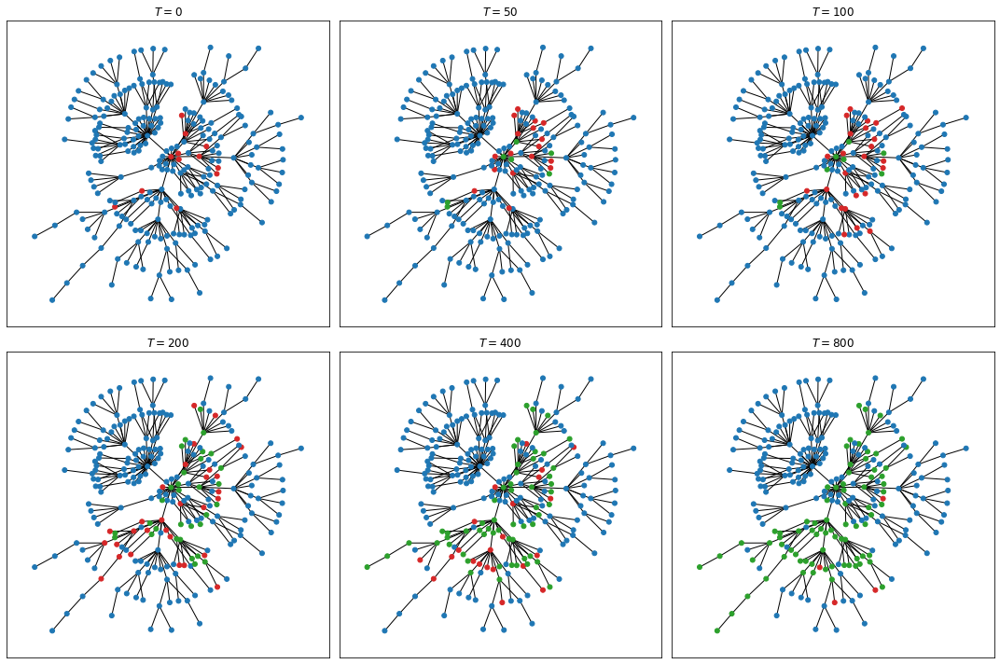

In [584]:
f,axs = visualize_iters(ba_g,ba_sir_iters,time_slices=[0,50,100,200,400,800])

Text(0.5, 1.0, 'Barabasi-Albert graph, $N=250$, $\\beta=0.01$, $\\gamma=0.005$, $f_0=0.05$')

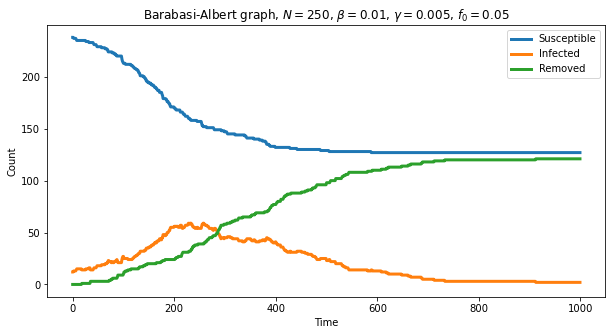

In [474]:
_df = iters_to_node_count_df(ba_sir_iters)
_df.columns = ['Susceptible','Infected','Removed']

f,ax = plt.subplots(figsize=(10,5))

_df.plot(ax=ax,lw=3)

ax.set_ylabel('Count')
ax.set_xlabel('Time')
ax.set_title(r'Barabasi-Albert graph, $N=250$, $\beta=0.01$, $\gamma=0.005$, $f_0=0.05$')

## Threshold model

### Erdos-Renyi

In [677]:
# Model selection
er_thresh_model = ep.ThresholdModel(er_g)

# Model configuration
er_thresh_config = mc.Configuration()
er_thresh_config.add_model_parameter('fraction_infected',0.05)
er_thresh_model.set_initial_status(er_thresh_config)

# Set node parameters
for i in er_g.nodes():
    er_thresh_config.add_node_configuration("threshold", i, 0.25)

# Run simulation
er_thresh_iters = er_thresh_model.iteration_bunch(25)

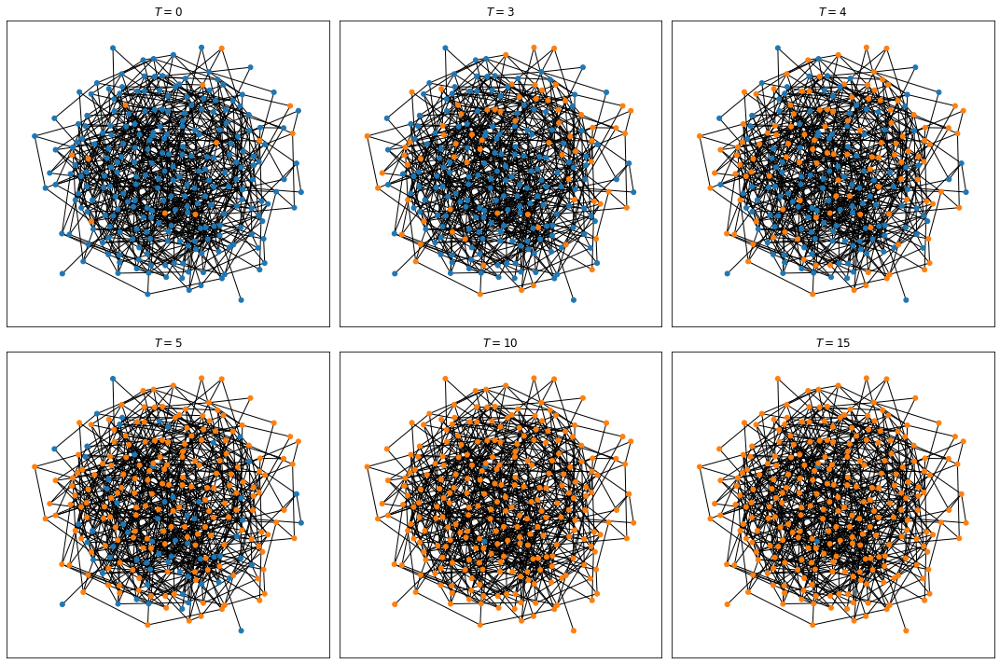

In [678]:
f,axs = visualize_iters(er_g,er_thresh_iters,time_slices=[0,3,4,5,10,15])

Text(0.5, 1.0, 'Erdos-Renyi graph, threshold$=0.3$, $f_0=0.05$')

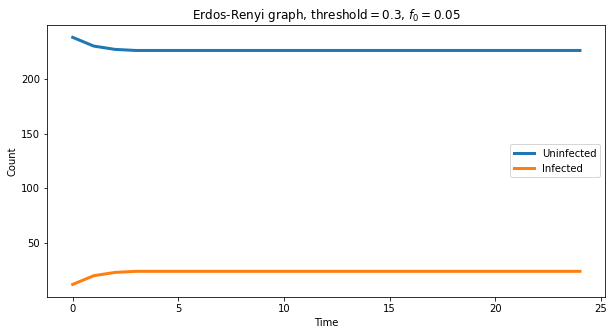

In [672]:
_df = iters_to_node_count_df(er_thresh_iters)
_df.columns = ['Uninfected','Infected']

f,ax = plt.subplots(figsize=(10,5))

_df.plot(ax=ax,lw=3)

ax.set_ylabel('Count')
ax.set_xlabel('Time')
ax.set_title(r'Erdos-Renyi graph, threshold$=0.3$, $f_0=0.05$')

Compare to an SI model.

Text(0.5, 1.0, 'Erdos-Renyi, $N=250$, $f_0=0.05$')

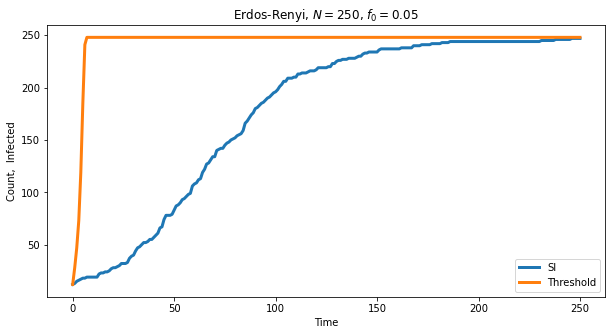

In [679]:
infected_c = pd.concat([
    iters_to_node_count_df(er_si_iters),
    iters_to_node_count_df(er_thresh_iters),
],
    axis=1
)

infected_c = infected_c[1]
infected_c.columns = ['SI','Threshold']
infected_c.fillna(method='ffill',inplace=True)

f,ax = plt.subplots(figsize=(10,5))
infected_c.loc[:250].plot(ax=ax,lw=3)
ax.set_ylabel('Count,  Infected')
ax.set_xlabel('Time')
ax.set_title(r'Erdos-Renyi, $N=250$, $f_0=0.05$')

### Watts-Strogatz

Text(0.5, 1.0, 'Watts-Strogatz graph, threshold$=0.3$, $f_0=0.05$')

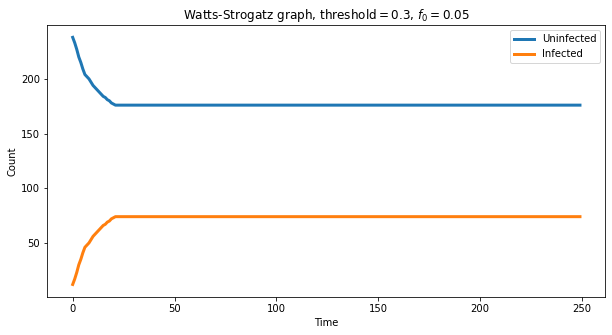

In [693]:
# Model selection
ws_thresh_model = ep.ThresholdModel(ws_g)

# Model configuration
ws_thresh_config = mc.Configuration()
ws_thresh_config.add_model_parameter('fraction_infected',0.05)
ws_thresh_model.set_initial_status(ws_thresh_config)

# Set node parameters
for i in ws_g.nodes():
    ws_thresh_config.add_node_configuration("threshold", i, 0.4)

# Run simulation
ws_thresh_iters = ws_thresh_model.iteration_bunch(250)

# DataFrame
_df = iters_to_node_count_df(ws_thresh_iters)
_df.columns = ['Uninfected','Infected']

# Visualize
f,ax = plt.subplots(figsize=(10,5))

_df.plot(ax=ax,lw=3)

ax.set_ylabel('Count')
ax.set_xlabel('Time')
ax.set_title(r'Watts-Strogatz graph, threshold$=0.3$, $f_0=0.05$')

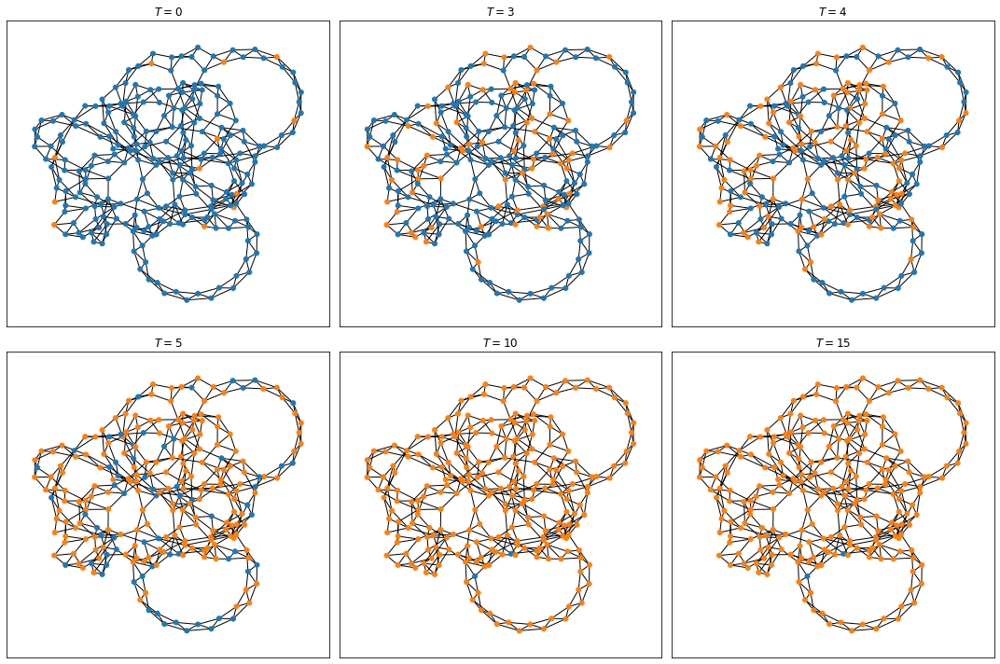

In [689]:
f,axs = visualize_iters(ws_g,er_thresh_iters,time_slices=[0,3,4,5,10,15])

Compare to an SI model.

Text(0.5, 1.0, 'Watts-Strogatz, $N=250$, $f_0=0.05$')

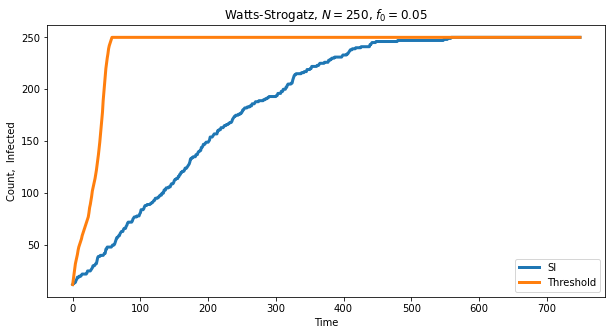

In [511]:
infected_c = pd.concat([
    iters_to_node_count_df(ws_si_iters),
    iters_to_node_count_df(ws_thresh_iters),
],
    axis=1
)

infected_c = infected_c[1]
infected_c.columns = ['SI','Threshold']
infected_c.fillna(method='ffill',inplace=True)

f,ax = plt.subplots(figsize=(10,5))
infected_c.plot(ax=ax,lw=3)
ax.set_ylabel('Count,  Infected')
ax.set_xlabel('Time')
ax.set_title(r'Watts-Strogatz, $N=250$, $f_0=0.05$')

## Profile model

### Erdos-Renyi

Text(0.5, 0, 'Time')

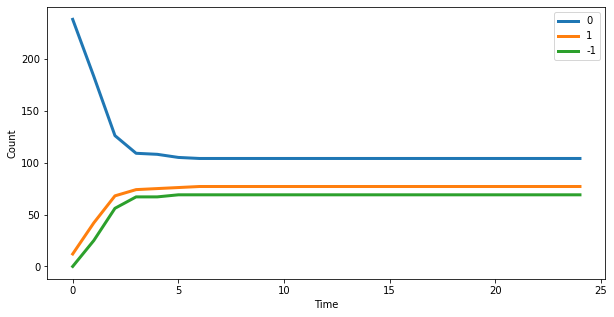

In [709]:
# Model selection
er_profile_model = ep.ProfileModel(er_g)

# Model configuration
er_profile_config = mc.Configuration()
er_profile_config.add_model_parameter('fraction_infected',0.05)
er_profile_config.add_model_parameter('blocked',0.1)
er_profile_config.add_model_parameter('adopter_rate',0)

# Set node parameters
for n in er_g.nodes():
    er_profile_config.add_node_configuration("profile", n, 0.5)

# Setup model
er_profile_model.set_initial_status(er_profile_config)
    
# Run simulation
er_profile_iters = er_profile_model.iteration_bunch(25)

# DataFrame
_df = iters_to_node_count_df(er_profile_iters)
# _df.columns = ['Uninfected','Infected']

# Visualize
f,ax = plt.subplots(figsize=(10,5))

_df.plot(ax=ax,lw=3)

ax.set_ylabel('Count')
ax.set_xlabel('Time')
# ax.set_title(r'Watts-Strogatz graph, threshold$=0.3$, $f_0=0.05$')

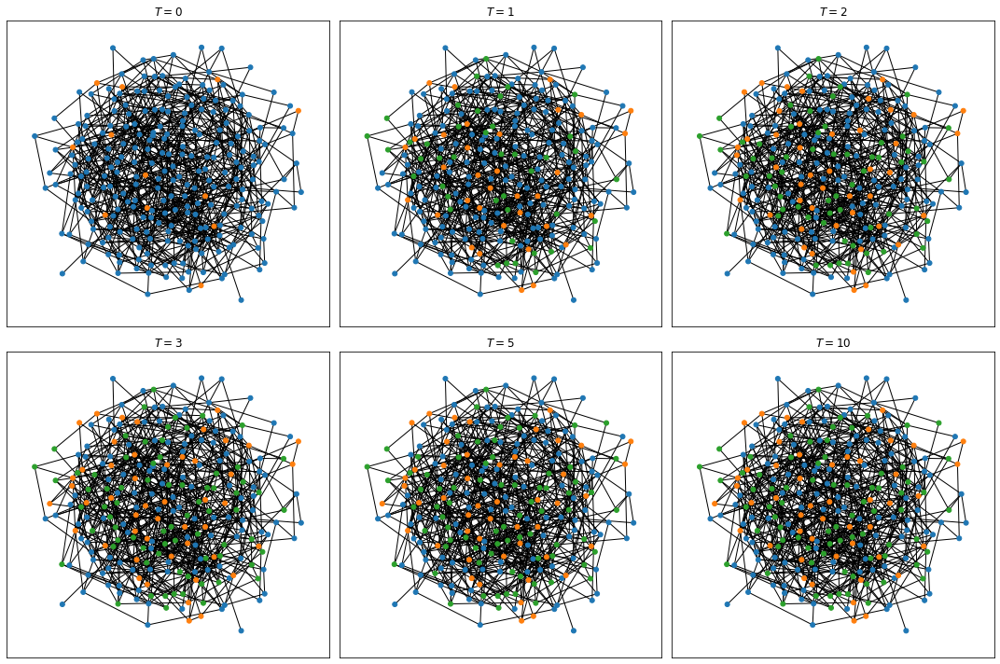

In [704]:
f,axs = visualize_iters(er_g,er_profile_iters,time_slices=[0,1,2,3,5,10])

### Watts-Strogatz

Text(0.5, 0, 'Time')

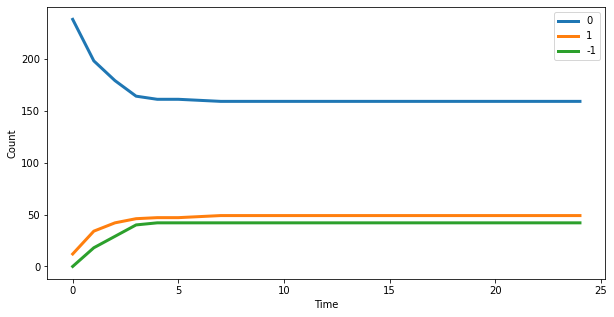

In [706]:
# Model selection
ws_profile_model = ep.ProfileModel(ws_g)

# Model configuration
ws_profile_config = mc.Configuration()
ws_profile_config.add_model_parameter('fraction_infected',0.05)
ws_profile_config.add_model_parameter('blocked',0.1)
ws_profile_config.add_model_parameter('adopter_rate',0)

# Set node parameters
for n in ws_g.nodes():
    ws_profile_config.add_node_configuration("profile", n, 0.5)

# Setup model
ws_profile_model.set_initial_status(ws_profile_config)
    
# Run simulation
ws_profile_iters = ws_profile_model.iteration_bunch(25)

# DataFrame
_df = iters_to_node_count_df(ws_profile_iters)
# _df.columns = ['Uninfected','Infected']

# Visualize
f,ax = plt.subplots(figsize=(10,5))

_df.plot(ax=ax,lw=3)

ax.set_ylabel('Count')
ax.set_xlabel('Time')
# ax.set_title(r'Watts-Strogatz graph, threshold$=0.3$, $f_0=0.05$')

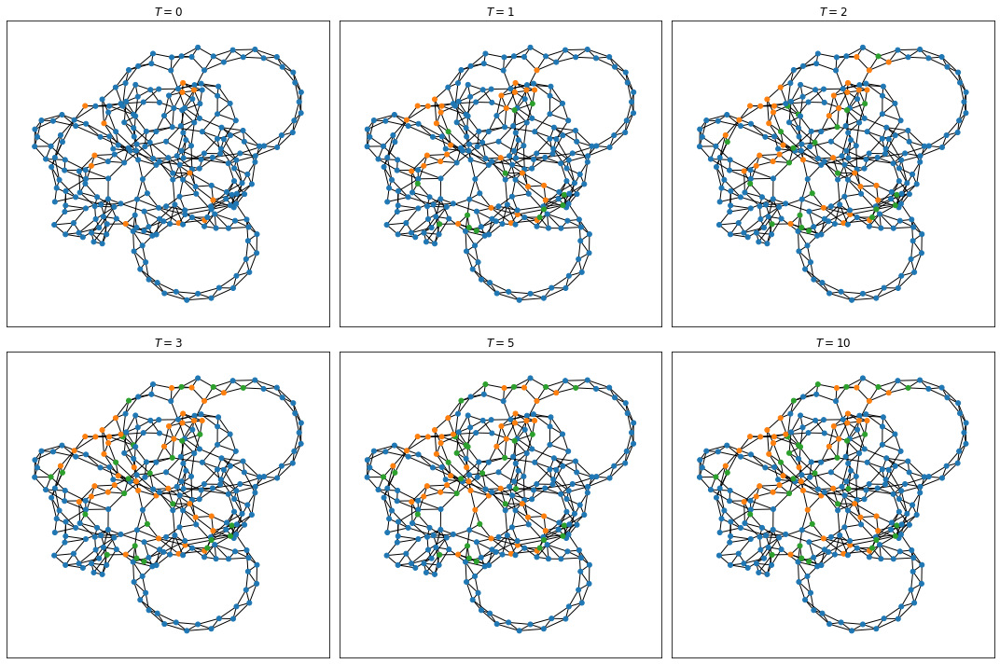

In [662]:
f,axs = visualize_iters(ws_g,ws_profile_iters,time_slices=[0,1,2,3,5,10])

### Barabasi-Albert

Text(0.5, 0, 'Time')

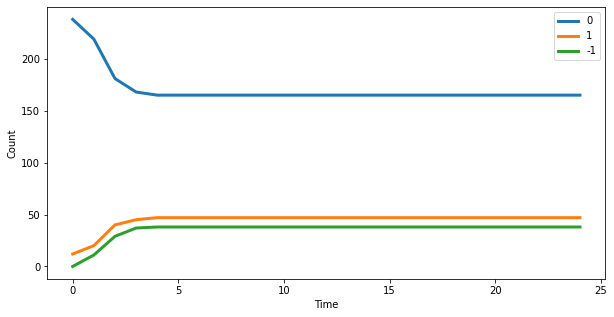

In [707]:
# Model selection
ba_profile_model = ep.ProfileModel(ba_g)

# Model configuration
ba_profile_config = mc.Configuration()
ba_profile_config.add_model_parameter('fraction_infected',0.05)
ba_profile_config.add_model_parameter('blocked',0.01)
ba_profile_config.add_model_parameter('adopter_rate',0)

# Set node parameters
for n in ba_g.nodes():
    ba_profile_config.add_node_configuration("profile", n, 0.5)

# Setup model
ba_profile_model.set_initial_status(ba_profile_config)
    
# Run simulation
ba_profile_iters = ba_profile_model.iteration_bunch(25)

# DataFrame
_df = iters_to_node_count_df(ba_profile_iters)
# _df.columns = ['Uninfected','Infected']

# Visualize
f,ax = plt.subplots(figsize=(10,5))

_df.plot(ax=ax,lw=3)

ax.set_ylabel('Count')
ax.set_xlabel('Time')
# ax.set_title(r'Watts-Strogatz graph, threshold$=0.3$, $f_0=0.05$')

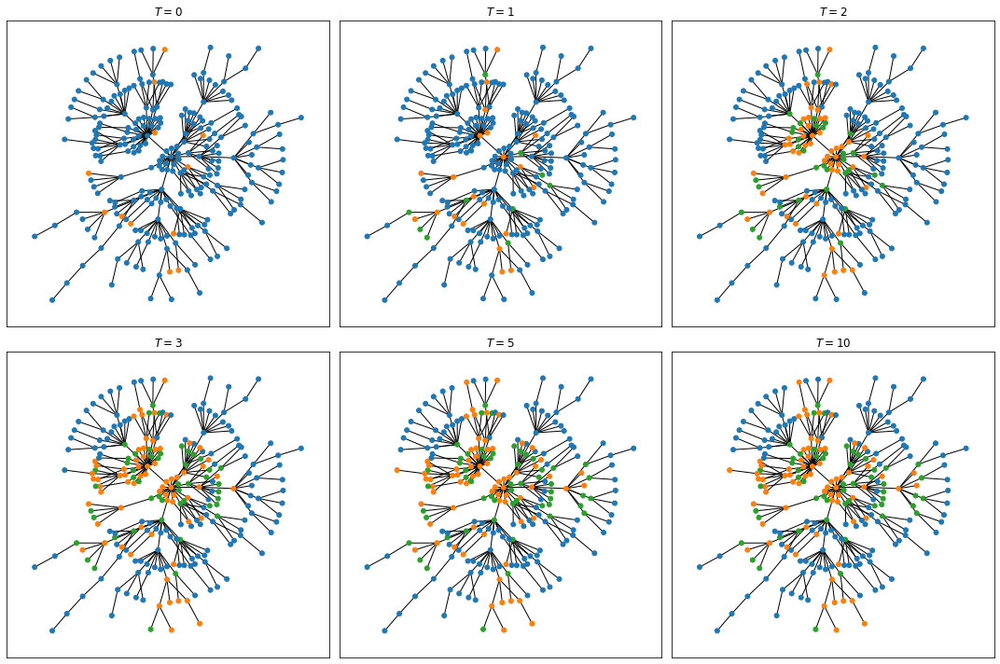

In [664]:
f,axs = visualize_iters(ba_g,ba_profile_iters,time_slices=[0,1,2,3,5,10])

### Stochastic blockmodel

Text(0.5, 0, 'Time')

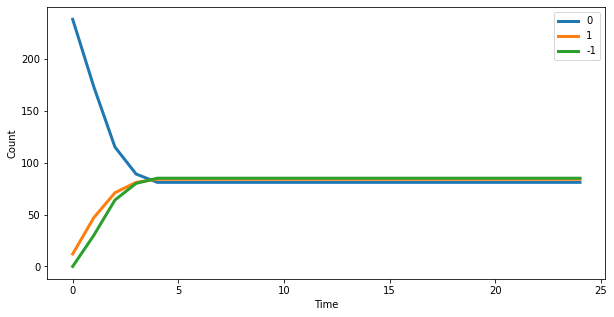

In [708]:
# Model selection
sb_profile_model = ep.ProfileModel(sb_g)

# Model configuration
sb_profile_config = mc.Configuration()
sb_profile_config.add_model_parameter('fraction_infected',0.05)
sb_profile_config.add_model_parameter('blocked',0.01)
sb_profile_config.add_model_parameter('adopter_rate',0)

# Set node parameters
for n in sb_g.nodes():
    sb_profile_config.add_node_configuration("profile", n, 0.5)

# Setup model
sb_profile_model.set_initial_status(sb_profile_config)
    
# Run simulation
sb_profile_iters = sb_profile_model.iteration_bunch(25)

# DataFrame
_df = iters_to_node_count_df(sb_profile_iters)
# _df.columns = ['Uninfected','Infected']

# Visualize
f,ax = plt.subplots(figsize=(10,5))

_df.plot(ax=ax,lw=3)

ax.set_ylabel('Count')
ax.set_xlabel('Time')
# ax.set_title(r'Watts-Strogatz graph, threshold$=0.3$, $f_0=0.05$')

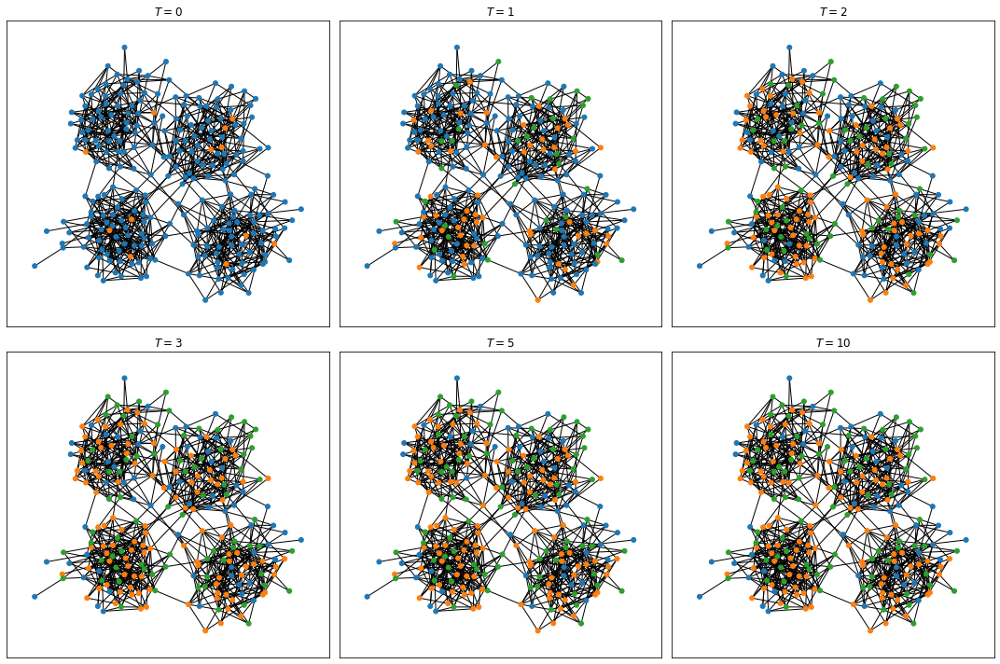

In [666]:
f,axs = visualize_iters(sb_g,sb_profile_iters,time_slices=[0,1,2,3,5,10])